In [16]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format='retina'
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [17]:
import requests
import numpy as np
import pandas as pd
import os,sys,glob
import matplotlib.pyplot as plt
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shutil import which
import geopandas as gpd
import dask
import zipfile
from pyproj import Proj, transform
import subprocess
from shapely.geometry import Point
import asp_binder_utils as asp_utils
import xyzservices
import rioxarray as rxr
import rasterio
from shapely.geometry import box
from sliderule import earthdata, icesat2, gedi
import contextily as ctx
import sliderule
import xyzservices

In [18]:
def get_pc_align_shift_params(pc_align_log):
    """
    returns tranlation,rotation,scale and total shift by pc_align
    Parameters
    ----------
    pc_align_log: str
        path to log file written by ASP pc_align run
    Returns
    ----------
    total_shift: float
        value of applied displacement
    trans_shift: tuple
        value of north-east-down displacement
    rot_angle: tuple
        value of north-east-down euler angles of rotation
    scale_change: float
        change in scale
    """
    with open(pc_align_log, 'r') as f:
        content = f.readlines()
    # get total shift
    substring = 'Maximum displacement of points between the source cloud with any initial transform applied to it and the source cloud after alignment to the reference'
    max_alignment_string = [i for i in content if substring in i]
    total_shift = float(max_alignment_string[0].split(':',15)[-1].split('m')[0])
    
    # get translation shift
    substring = 'Translation vector (North-East-Down, meters):' 
    trans_shift_string = [i for i in content if substring in i][0]
    north_shift = float(trans_shift_string.split('Vector3')[1].split('(')[1].split(',')[0])
    east_shift = float(trans_shift_string.split('Vector3')[1].split(',')[1])
    down_shift = float(trans_shift_string.split('Vector3')[1].split(',')[2].split(')')[0])
    
    # get rotational angle shift
    substring = ' Euler angles (North-East-Down, degrees)'
    rotation_string = [i for i in content if substring in i][0]
    north_angle = float(rotation_string.split('Vector3')[1].split('(')[1].split(',')[0])
    east_angle = float(rotation_string.split('Vector3')[1].split(',')[1])
    down_angle = float(rotation_string.split('Vector3')[1].split(',')[2].split(')')[0])
    
    # get scale change
    substring = 'Transform scale'
    scale_string = [i for i in content if substring in i][0]
    scale_change = float(scale_string.split('= ')[1].split('\n')[0])+1
    
    
    return total_shift, (north_shift,east_shift,down_shift), (north_angle,east_angle,down_angle), scale_change

def apply_shift(gdf,dx,dy,dz,elevation_col = 'elevation_lm'):
    corr_col = gdf[elevation_col]+dz
    easting = gdf.geometry.x+dx
    northing = gdf.geometry.y+dy
    gdf_corrected = gdf.drop(['geometry','easting','northing',elevation_col],axis=1)
    gdf_corrected[elevation_col] = corr_col
    
    gdf_corrected['easting'] = easting
    gdf_corrected['northing'] = northing
    geometry = [Point(xy) for xy in zip(gdf_corrected['easting'], gdf_corrected['northing'])]
    gdf_corrected = gpd.GeoDataFrame(gdf_corrected,geometry=geometry,crs=gdf.estimate_utm_crs())
    return gdf_corrected

In [19]:
def perform_gedi_dtm_alignment(workunit):
    gf_is2_stac = gpd.read_file('20250709_PCD_3dep_is2_tracks.geojson')
    gf_gedi_stac = gpd.read_file('20250709_PCD_3dep_gedi_tracks.geojson')
    cwd = os.getcwd()
    print(f"Current working directory: {cwd}")
    
    mask = gf_gedi_stac['usgs_workunit'] == workunit
    
    gedi_ids = [str(value)+'.h5' for value in gf_gedi_stac[mask].gedi_granule_id.values.tolist()]
    print(gedi_ids)
    datetime = [str(np.sort(gf_gedi_stac[mask].date.values)[0]), str(np.sort(gf_gedi_stac[mask].date.values)[-1])]
    
    print(datetime)
    
    datadir = os.path.join('/panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/',
                           f'{workunit}_processing')
    os.chdir(datadir)
    print(f"Current working directory is {datadir}")
    
    ##load DTM and DSM for the workunit
    lidar_dtm_fn = glob.glob(f'{workunit}-DTM_fill_window_size_4_mos.tif')[0]
    da_lidar_dtm = rxr.open_rasterio(lidar_dtm_fn, masked=True).squeeze()
    
    lidar_dsm_fn = glob.glob(f'{workunit}-DSM_mos.tif')[0]
    da_lidar_dsm = rxr.open_rasterio(lidar_dsm_fn, masked=True).squeeze()
    
    
    
    da_bounds = da_lidar_dsm.rio.bounds()  # (minx, miny, maxx, maxy)
    da_box = box(*da_bounds)
    gf_search = gpd.GeoDataFrame(geometry=[da_box],
                                 columns=['geometry'],
                                 crs = da_lidar_dsm.rio.crs)
    gf_search = gf_search.to_crs(4326)
    
    poly_sliderule = sliderule.toregion(gf_search)['poly']
    #https://nbviewer.org/github/ICESat2-SlideRule/sliderule-python/blob/main/examples/phoreal.ipynb
    parms = {
        "poly": poly_sliderule,
        "t0": datetime[0],
        "t1": datetime[1],
    }
    
    parms_gedi = {
        "poly": poly_sliderule,
        "t0": datetime[0],
        "t1": datetime[1],
        'anc_fields':['master_frac','energy_total','rh','quality_flag']
    }
    
    
    sliderule.init("slideruleearth.io", verbose=False)
    earthdata.set_max_resources(max_resources=1000)
    
    gf_gedi = gedi.gedi02ap(parms_gedi,
                            resources=gedi_ids)
    
    print(da_lidar_dtm.min(),da_lidar_dtm.mean(),da_lidar_dtm.max())
    
    
    quality_filter = gf_gedi['quality_flag'] == 1
    gf_gedi_filtered = gf_gedi[quality_filter]
    gf_gedi_filtered.describe()

    gf_gedi_filtered_proj = gf_gedi_filtered.to_crs(da_lidar_dtm.rio.crs)
    gf_gedi_filtered_proj['easting'] = gf_gedi_filtered_proj.geometry.x
    gf_gedi_filtered_proj['northing'] = gf_gedi_filtered_proj.geometry.y
    altimetry_csv_fn_proj = f'GEDI_filtered_all_control_points_utm_{workunit}.csv'
    gf_gedi_filtered_proj[['easting','northing','elevation_lm']].to_csv(altimetry_csv_fn_proj,index=False)
    
    terrain_map = xyzservices.providers.Esri.WorldImagery() #Used to render basemap
    #verbose = False #  Will only print the bash commands and whether the process ran sucessfully or not
    verbose = True # will print all the logs printed by ASP
    alignment_algorithm = 'point-to-plane' # suggested to use point-to-point if the terrain variability is low (more flat terrain cases) and when using altimetry points
    max_displacement = 40 #you might have to play with this to adapt to different datasets
    tsrs = glob.glob(f'../../../pcd_usgs_lpc_proc_total_bounds/{workunit}_processing/UTM_*N_WGS84_G2139_3D.wkt')[0] # input projection
    print(tsrs)
    tr = 1 #DEM resolution
    
    
    pc_align = which('../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/pc_align')
    ref_alitmetry = altimetry_csv_fn_proj
    src_dem = lidar_dtm_fn
    alignment_dir  = f'alignment_sparse_altimetry_all_{workunit}_proj/gedi_aligned2DTM'
    
    csv_proj4 = tsrs
    #csv_proj4 = 'EPSG:7912'
    
    #altimetry_datum = 'WGS84'
    csv_format = '1:easting,2:northing,3:height_above_datum'
    alignment_call = f"{pc_align}  --compute-translation-only --highest-accuracy  --csv-format '{csv_format}' --csv-srs '{csv_proj4}' --save-transformed-source-points --alignment-method {alignment_algorithm}  --max-displacement {max_displacement} {src_dem} {ref_alitmetry} -o {alignment_dir}"
    asp_utils.run_bash_command(alignment_call,verbose=verbose)
    
    
    aligned_altimetry = glob.glob(f'{alignment_dir}*trans_source.csv')[0]
    alignment_matrix = glob.glob(f'{alignment_dir}*transform.txt')[0]
    alignment_log = glob.glob(f'{alignment_dir}*log*pc_align*.txt')[-1]
    
    
    geodiff = which('../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff')
    initial_output_prefix = 'initial_proj'
    print(f"Computing elevation difference before alignment between {ref_alitmetry} and {src_dem}\n\n")
    geodiff_call = f"{geodiff} {ref_alitmetry} {src_dem} --csv-format {csv_format} --csv-srs '{csv_proj4}' -o {initial_output_prefix}"
    asp_utils.run_bash_command(geodiff_call,verbose=verbose)
    initial_elevation_difference_fn = glob.glob(initial_output_prefix+'-diff.csv')[0]
    print("\n\nInitial elevation difference saved at {}".format(initial_elevation_difference_fn))
    
    
    geodiff = which('../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff')
    final_output_prefix = 'final_proj'
    print(f"Computing elevation difference before alignment between {aligned_altimetry} and {src_dem}\n\n")
    geodiff_call = f"{geodiff} {aligned_altimetry} {src_dem} --csv-format {csv_format} --csv-srs '{csv_proj4}' -o {final_output_prefix}"
    asp_utils.run_bash_command(geodiff_call,verbose=verbose)
    final_elevation_difference_fn = glob.glob(final_output_prefix+'-diff.csv')[0]
    print("\n\nFinal elevation difference saved at {}".format(final_elevation_difference_fn))
    
    
    dm,(dx,dy,dz),rot,scale = get_pc_align_shift_params(alignment_log)
    asp_utils.plot_alignment_maps_altimetry(gf_gedi_filtered_proj,src_dem,initial_elevation_difference_fn,
                                            final_elevation_difference_fn,plot_crs=da_lidar_dtm.rio.crs,dx=dx,dy=dy,dz=dz)
    
    
    
    
    new_gedi_gdf = apply_shift(gf_gedi_filtered_proj,dx,dy,dz)
    
    outfn = f'GEDI_aligned_product_{workunit}.gpkg'
    new_gedi_gdf.to_file(outfn,driver='GPKG')
    
    print(f"Aligned GEDI product saved at {outfn}")
    os.chdir(cwd)
    print("******************")
    print(f"Translation vector: dx = {dx:.2f}m, dy = {dy:.2f}m, dz = {dz:.2f}m")
    print("******************")
    return new_gedi_gdf

## Align USGS Workunits

In [20]:
%cd /panfs/ccds02/home/sbhusha1/notebooks/pcd

/panfs/ccds02/home/sbhusha1/notebooks/pcd


In [21]:
gf_gedi_stac = gpd.read_file('20250709_PCD_3dep_gedi_tracks.geojson')
workunit_list = np.unique(gf_gedi_stac.usgs_workunit.values).tolist()

In [22]:
workunit_list

['AZ_PimaCo_2_2021',
 'CA_SanFrancisco_1_B23',
 'CA_YosemiteNP_2019',
 'CO_WestCentral_2019',
 'GA_Central_3_2019',
 'NE_Northeast_Phase2_2_2020',
 'TX_DesertMountains_B1_2018',
 'WI_Brown_2_2020',
 'WY_FEMA_East_B9_2019']

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2021261011319_O15667_02_T08065_02_003_02_V002.h5', 'GEDI02_A_2021264234230_O15728_02_T10605_02_003_02_V002.h5', 'GEDI02_A_2021285225842_O16053_03_T08636_02_003_02_V002.h5', 'GEDI02_A_2021332204942_O16780_02_T08218_02_003_02_V002.h5']
['2021-09-18T00:00:00.000', '2021-11-28T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/AZ_PimaCo_2_2021_processing
<xarray.DataArray ()> Size: 4B
array(670.97144, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(987.72284, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(1124.6311, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
../../../pcd_usgs_lpc_proc_total_bounds/AZ_PimaCo_2_2021_processing/UTM_12N_WGS84

writing to alignment_sparse_altimetry_all_AZ_PimaCo_2_2021_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.752613
Alignment took 15.2009 s
Number of errors: 287
Output: error percentile of smallest errors (meters): 16%: 0.0619791, 50%: 0.247165, 84%: 1.38461
Output: mean of smallest errors (meters): 25%: 0.0497899, 50%: 0.111016, 75%: 0.205909, 100%: 0.887536
Final error computation took 0.186332 s
Alignment transform (origin is planet center):
                 1                  0                  0  19.32940509589389
                 0                  1                  0 -21.16961256973445
                 0                  0                  1 -18.19861285574734
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(-1946836.5,-5060718.8,3349037.9)
Centroid of source points (lat,lon,z): Vector3(31.873622,-111.04152,944.50629)

Translation vector (Cartesian, meters): Vector3(19.329405,-21.169613,-18.198613)
Translation vector (North-East-Down, meters): Vector3(-22.223002,25.64136,-1.2754376)
Tran

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       27.3401 meters
Min difference:       -42.8399 meters
Mean difference:      -2.5599 meters
StdDev of difference: 7.76762 meters
Median difference:    -1.9306 meters
Writing difference file: initial_proj-diff.csv


Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_AZ_PimaCo_2_2021_proj/gedi_aligned2DTM-trans_source.csv and AZ_PimaCo_2_2021-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_AZ_PimaCo_2_2021_proj/gedi_aligned2DTM-trans_source.csv AZ_PimaCo_2_2021-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/AZ_PimaCo_2_2021_pr

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       6.31657 meters
Min difference:       -12.3614 meters
Mean difference:      -0.4779 meters
StdDev of difference: 2.16363 meters
Median difference:    -0.0260732 meters
Writing difference file: final_proj-diff.csv


Final elevation difference saved at final_proj-diff.csv


Child returned 0


Aligned GEDI product saved at GEDI_aligned_product_AZ_PimaCo_2_2021.gpkg
******************
Translation vector: dx = -22.22m, dy = 25.64m, dz = -1.28m
******************


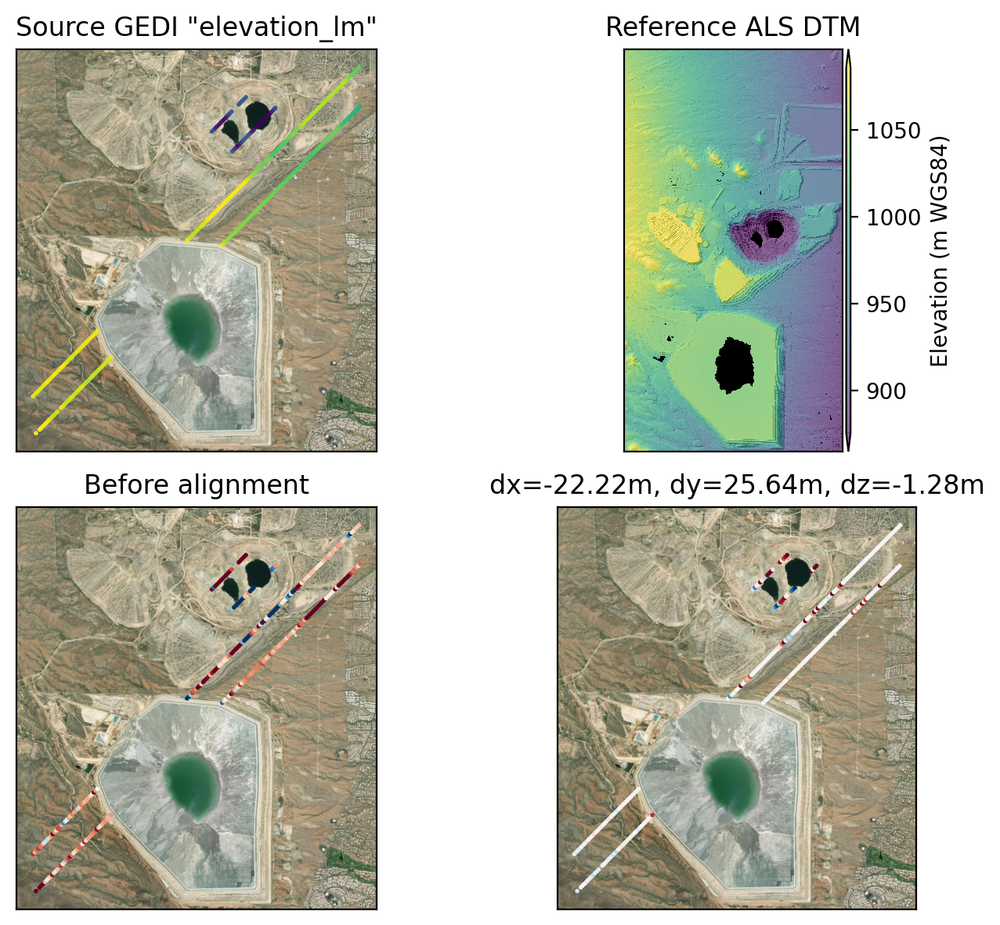

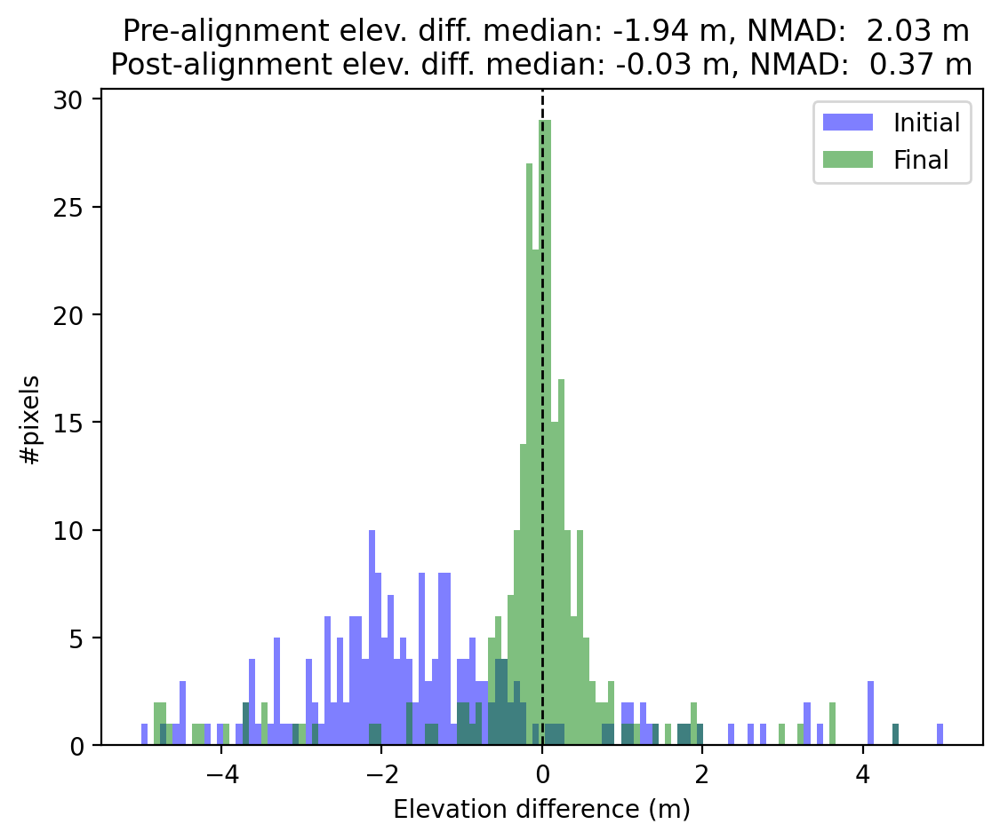

In [23]:
_= perform_gedi_dtm_alignment(workunit_list[0])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2023028212552_O23387_02_T09397_02_003_02_V002.h5']
['2023-01-28T00:00:00.000', '2023-01-28T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/CA_SanFrancisco_1_B23_processing
<xarray.DataArray ()> Size: 4B
array(-35.18846, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(29.928547, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(250.98357, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
../../../pcd_usgs_lpc_proc_total_bounds/CA_SanFrancisco_1_B23_processing/UTM_10N_WGS84_G2139_3D.wkt
../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/pc_align  --compute-translation-only --highest-accuracy  --csv-format '1:easting,2:northi

writing to alignment_sparse_altimetry_all_CA_SanFrancisco_1_B23_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750602
Alignment took 22.7482 s
Number of errors: 830
Output: error percentile of smallest errors (meters): 16%: 0.0651342, 50%: 0.251696, 84%: 1.1722
Output: mean of smallest errors (meters): 25%: 0.0486056, 50%: 0.107553, 75%: 0.208364, 100%: 1.07511
Final error computation took 0.186456 s
Alignment transform (origin is planet center):
                 1                  0                  0 0.1884112423285842
                 0                  1                  0  3.376312992535532
                 0                  0                  1  3.837695994414389
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(-2709170.4,-4258864.4,3886077.5)
Centroid of source points (lat,lon,z): Vector3(37.778763,-122.46146,21.447361)

Translation vector (Cartesian, meters): Vector3(0.18841124,3.376313,3.837696)
Translation vector (North-East-Down, meters): Vector3(4.8403964,-1.6532035,-0.019478996)
Transl

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 98%
Max difference:       7.73511 meters
Min difference:       -11.1438 meters
Mean difference:      -0.0478883 meters
StdDev of difference: 1.4537 meters
Median difference:    -0.0651543 meters
Writing difference file: initial_proj-diff.csv


Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_CA_SanFrancisco_1_B23_proj/gedi_aligned2DTM-trans_source.csv and CA_SanFrancisco_1_B23-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_CA_SanFrancisco_1_B23_proj/gedi_aligned2DTM-trans_source.csv CA_SanFrancisco_1_B23-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bo

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 98%
Max difference:       7.40216 meters
Min difference:       -9.84068 meters
Mean difference:      0.033459 meters
StdDev of difference: 1.23227 meters
Median difference:    0.0112278 meters
Writing difference file: final_proj-diff.csv


Final elevation difference saved at final_proj-diff.csv


Child returned 0


Aligned GEDI product saved at GEDI_aligned_product_CA_SanFrancisco_1_B23.gpkg
******************
Translation vector: dx = 4.84m, dy = -1.65m, dz = -0.02m
******************


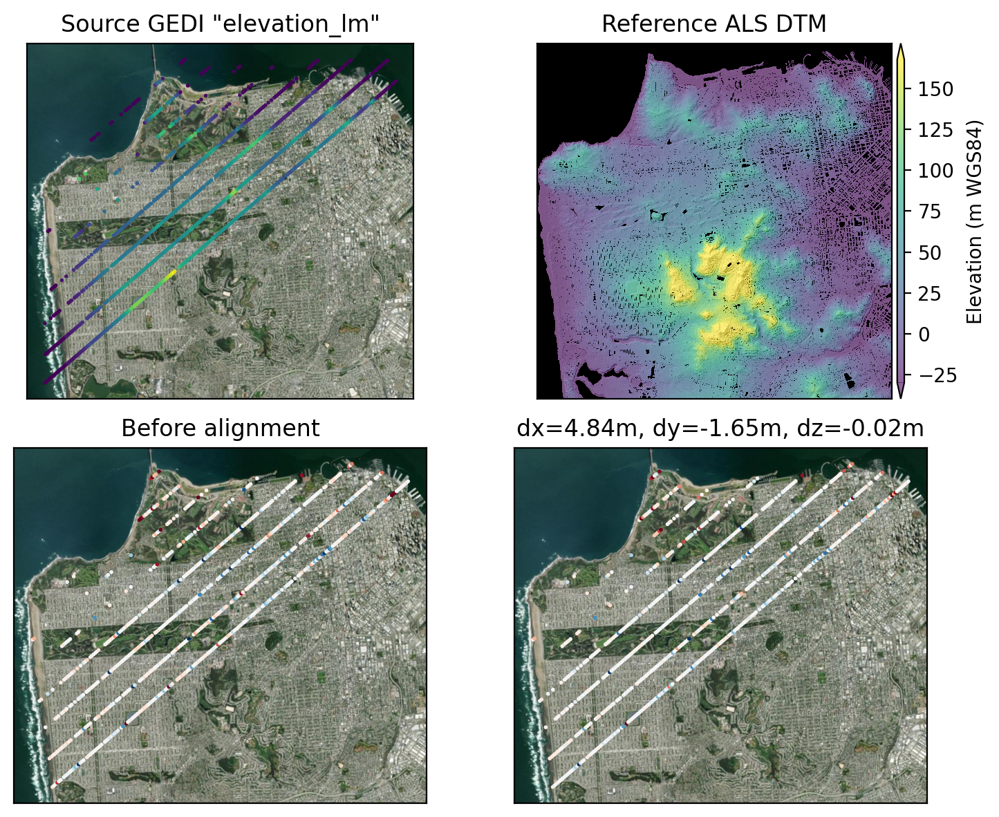

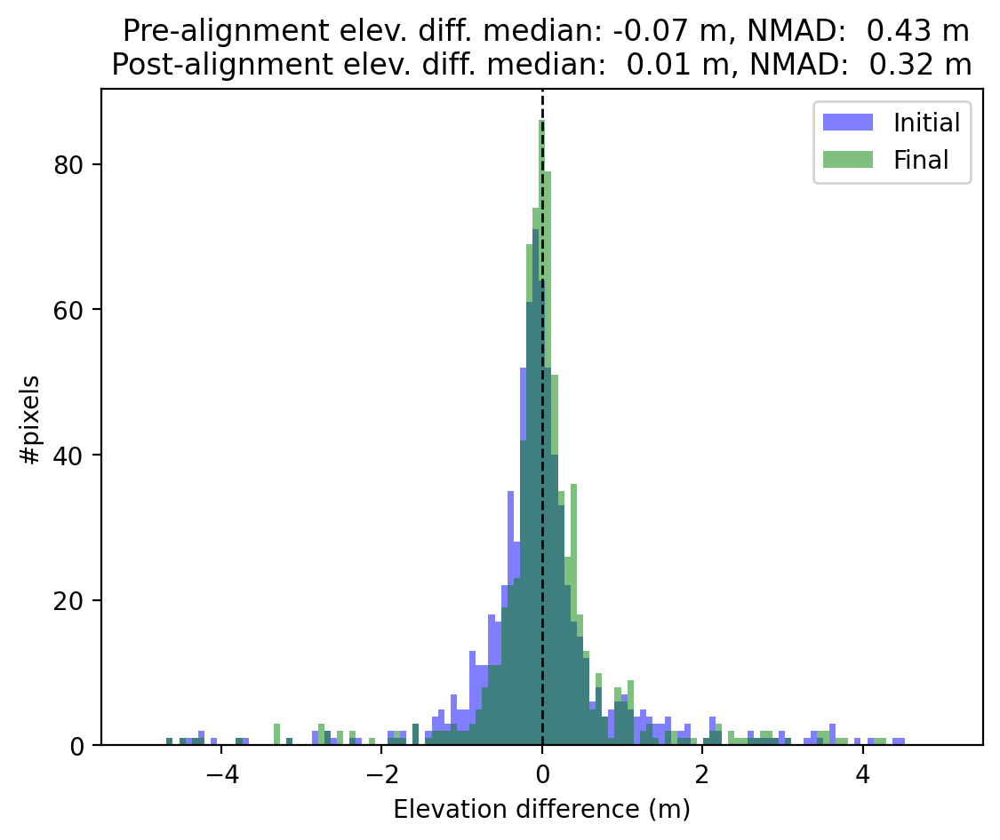

In [24]:
_ = perform_gedi_dtm_alignment(workunit_list[1])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2019279200308_O04626_02_T03812_02_003_01_V002.h5', 'GEDI02_A_2019302110619_O04977_02_T00966_02_003_01_V002.h5', 'GEDI02_A_2019309145009_O05088_03_T05331_02_003_01_V002.h5']
['2019-10-06T00:00:00.000', '2019-11-05T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/CA_YosemiteNP_2019_processing
<xarray.DataArray ()> Size: 4B
array(2638.3374, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(3008.0115, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(3557.7332, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
../../../pcd_usgs_lpc_proc_total_bounds/CA_YosemiteNP_2019_processing/UTM_11N_WGS84_G2139_3D.wkt
../../../../sw/StereoPipeline-3.6.0-alpha-2

writing to alignment_sparse_altimetry_all_CA_YosemiteNP_2019_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750205
Alignment took 25.8505 s
Number of errors: 3663
Output: error percentile of smallest errors (meters): 16%: 0.356878, 50%: 1.56391, 84%: 7.38335
Output: mean of smallest errors (meters): 25%: 0.280978, 50%: 0.656856, 75%: 1.33202, 100%: 3.88454
Final error computation took 0.323957 s
Alignment transform (origin is planet center):
                   1                    0                    0   -6.681582848541439
                   0                    1                    0 -0.01529328711330891
                   0                    0                    1    -4.87963180989027
                   0                    0                    0                    1
Centroid of source points (Cartesian, meters): Vector3(-2475563.6,-4375614.5,3916783.9)
Centroid of source points (lat,lon,z): Vector3(38.108534,-119.4996,3003.691)

Translation vector (Cartesian, meters): Vector3(-6.6815828,-0.015293286,-4.8796318)
Translation vector (North-East-Down, meters): Vector3(-5.8782

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 96%
Max difference:       58.7685 meters
Min difference:       -72.4364 meters
Mean difference:      -0.735026 meters
StdDev of difference: 9.06991 meters
Median difference:    0.0145035 meters
Writing difference file: initial_proj-diff.csv


Child returned 0




Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_CA_YosemiteNP_2019_proj/gedi_aligned2DTM-trans_source.csv and CA_YosemiteNP_2019-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_CA_YosemiteNP_2019_proj/gedi_aligned2DTM-trans_source.csv CA_YosemiteNP_2019-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/CA_YosemiteNP_2019_processing/UTM_11N_WGS84_G2139_3D.wkt' -o final_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 96%
Max difference:       55.0884 meters
Min difference:       -75.6422 meters
Mean difference:      -1.08278 meters
StdDev of difference: 9.01348 meters
Median difference:    -

Child returned 0




Final elevation difference saved at final_proj-diff.csv
Aligned GEDI product saved at GEDI_aligned_product_CA_YosemiteNP_2019.gpkg
******************
Translation vector: dx = -5.88m, dy = -5.81m, dz = 0.41m
******************


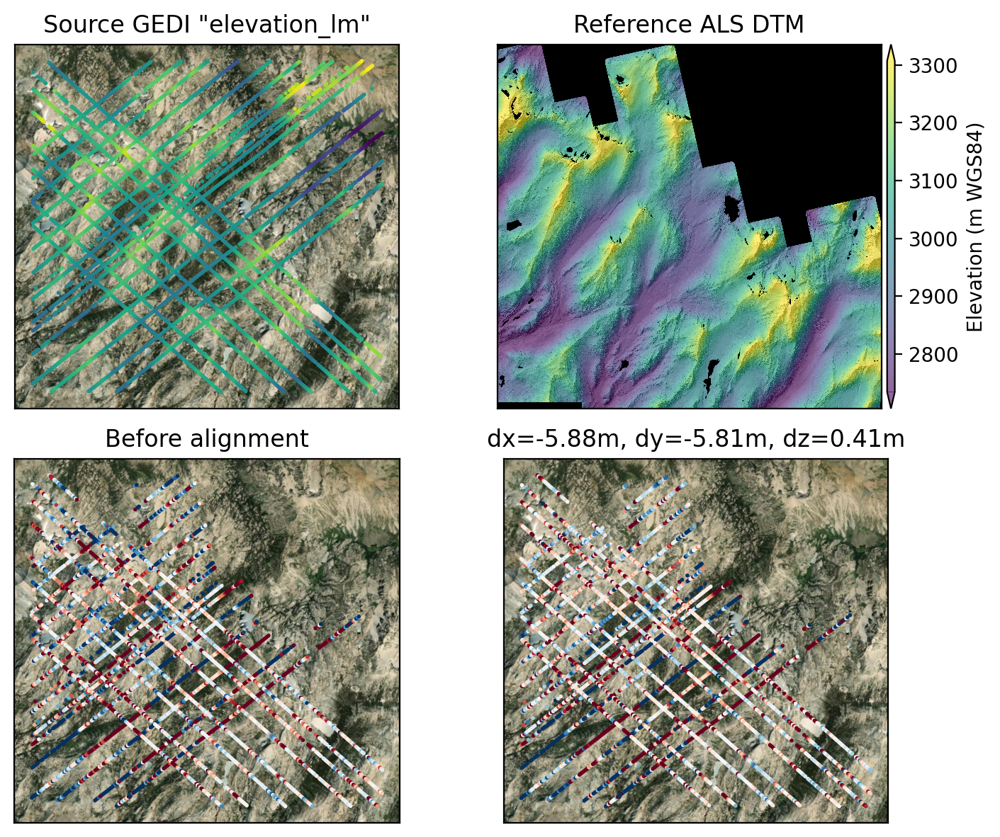

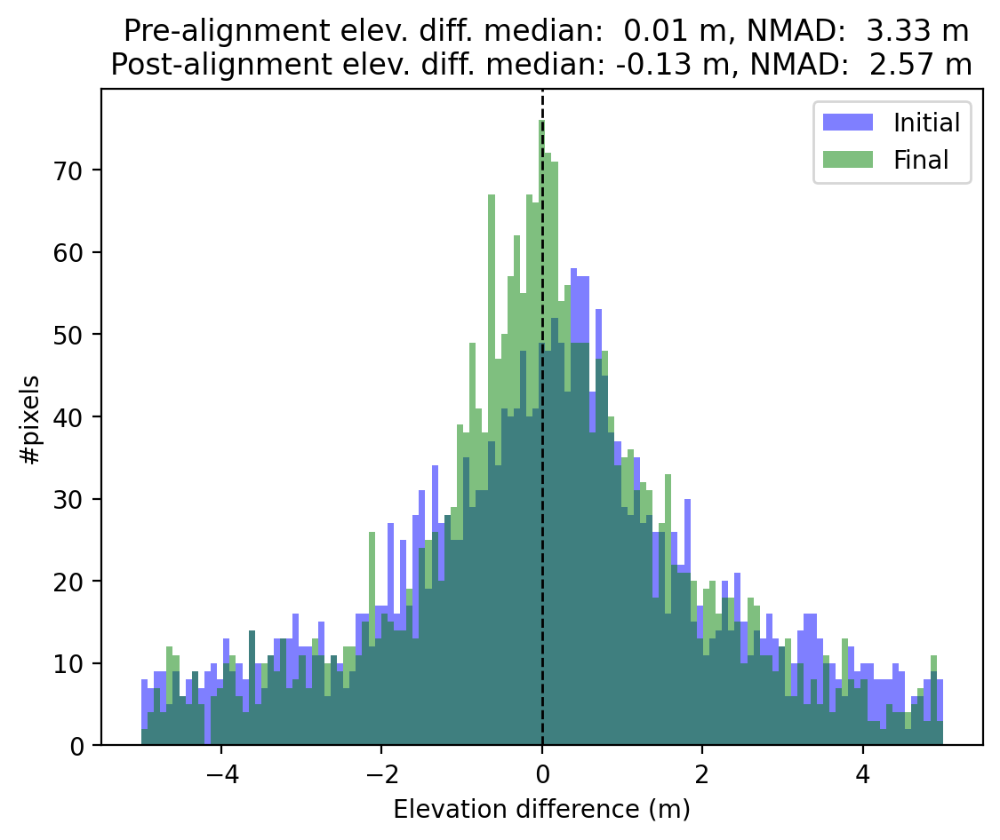

In [25]:
_ = perform_gedi_dtm_alignment(workunit_list[2])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2019228215125_O03836_03_T03938_02_003_01_V002.h5', 'GEDI02_A_2019247142840_O04126_03_T02362_02_003_02_V002.h5', 'GEDI02_A_2019255050055_O04244_02_T03888_02_003_01_V002.h5', 'GEDI02_A_2019270053052_O04477_03_T03785_02_003_01_V002.h5']
['2019-08-16T00:00:00.000', '2019-09-27T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/CO_WestCentral_2019_processing
<xarray.DataArray ()> Size: 4B
array(2480.378, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(3139.932, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(4108.2554, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
../../../pcd_usgs_lpc_proc_total_bounds/CO_WestCentral_2019_processing/UTM_13N_W

writing to alignment_sparse_altimetry_all_CO_WestCentral_2019_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750231
Alignment took 28.0754 s
Number of errors: 1081
Output: error percentile of smallest errors (meters): 16%: 0.218352, 50%: 0.815552, 84%: 2.49138
Output: mean of smallest errors (meters): 25%: 0.16629, 50%: 0.362948, 75%: 0.639027, 100%: 1.51258
Final error computation took 0.385533 s
Alignment transform (origin is planet center):
                 1                  0                  0  1.905547583242878
                 0                  1                  0 0.3956679049879313
                 0                  0                  1 0.3793922765180469
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(-1432652,-4759150.3,3989559)
Centroid of source points (lat,lon,z): Vector3(38.94227,-106.75343,3539.447)

Translation vector (Cartesian, meters): Vector3(1.9055476,0.3956679,0.37939228)
Translation vector (North-East-Down, meters): Vector3(0.8784629,1.7106123,0.48343738)
Translation ve

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 99%
Max difference:       17.2811 meters
Min difference:       -20.3328 meters
Mean difference:      0.0536194 meters
StdDev of difference: 2.9085 meters
Median difference:    0.477808 meters
Writing difference file: initial_proj-diff.csv


Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_CO_WestCentral_2019_proj/gedi_aligned2DTM-trans_source.csv and CO_WestCentral_2019-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_CO_WestCentral_2019_proj/gedi_aligned2DTM-trans_source.csv CO_WestCentral_2019-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/CO_Wes

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 99%
Max difference:       17.6905 meters
Min difference:       -19.8754 meters
Mean difference:      -0.472988 meters
StdDev of difference: 2.81174 meters
Median difference:    -0.0932085 meters
Writing difference file: final_proj-diff.csv


Final elevation difference saved at final_proj-diff.csv


Child returned 0


Aligned GEDI product saved at GEDI_aligned_product_CO_WestCentral_2019.gpkg
******************
Translation vector: dx = 0.88m, dy = 1.71m, dz = 0.48m
******************


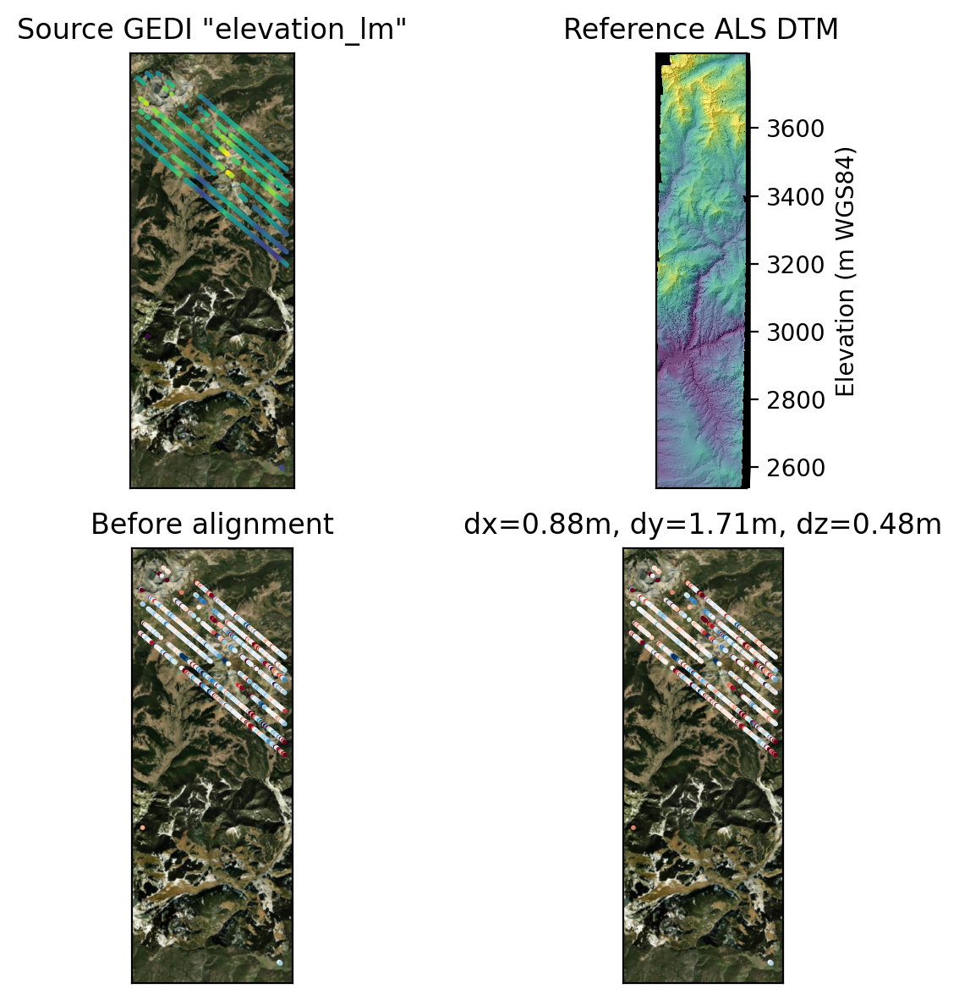

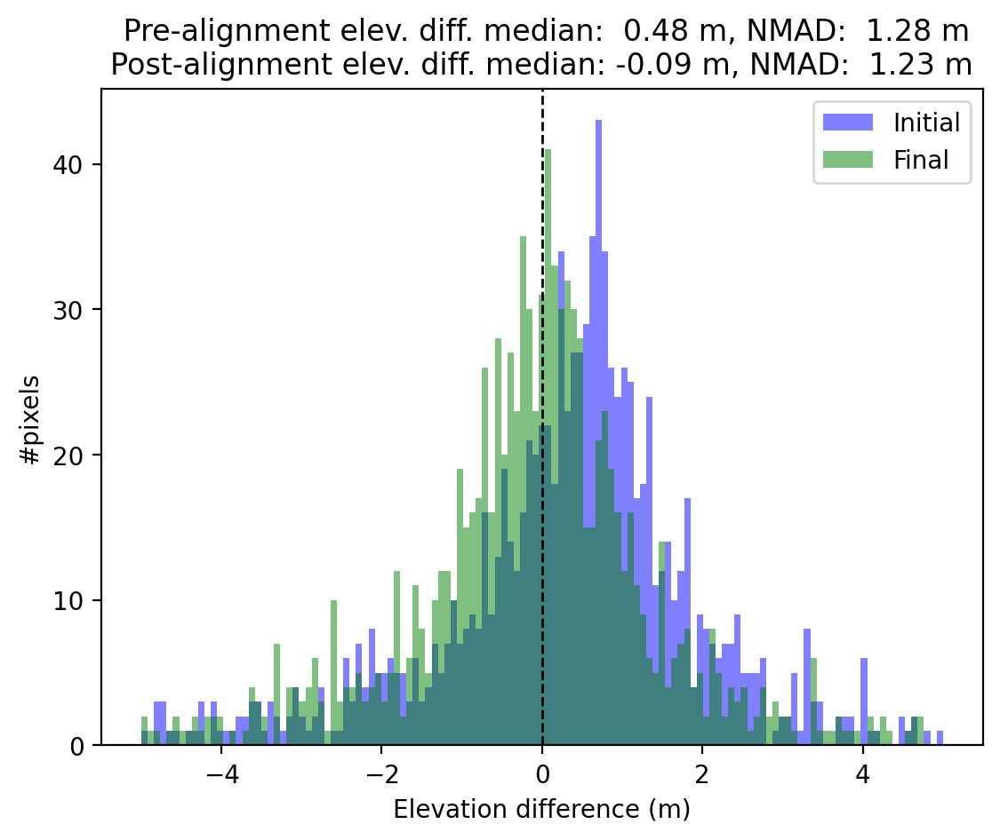

In [26]:
_ = perform_gedi_dtm_alignment(workunit_list[3])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2020040225749_O06582_03_T02744_02_003_01_V002.h5', 'GEDI02_A_2020044212416_O06643_03_T05590_02_003_01_V002.h5', 'GEDI02_A_2020048195041_O06704_03_T01321_02_003_01_V002.h5', 'GEDI02_A_2020052181703_O06765_03_T04320_02_003_01_V002.h5', 'GEDI02_A_2020056164321_O06826_03_T04167_02_003_01_V002.h5', 'GEDI02_A_2020060150939_O06887_03_T01474_02_003_01_V002.h5', 'GEDI02_A_2020064133554_O06948_03_T04320_02_003_01_V002.h5', 'GEDI02_A_2020068120206_O07009_03_T00051_02_003_01_V002.h5', 'GEDI02_A_2020072102816_O07070_03_T00204_02_003_01_V002.h5', 'GEDI02_A_2020076085423_O07131_03_T01780_02_003_01_V002.h5', 'GEDI02_A_2020080072040_O07192_03_T03050_02_003_01_V002.h5', 'GEDI02_A_2020084054801_O07253_03_T01627_02_003_01_V002.h5', 'GEDI02_A_2020088041519_O07314_03_T02897_02_003_01_V002.h5', 'GEDI02_A_2020092024236_O07375_03_T04167_02_003_01_V002.h5']
['2020-02-09T00:00:00.000', '2020-04-01T00:00:00.000']
Current working direc

writing to alignment_sparse_altimetry_all_GA_Central_3_2019_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750035
Alignment took 54.0649 s
Number of errors: 7113
Output: error percentile of smallest errors (meters): 16%: 0.0825678, 50%: 0.285029, 84%: 1.21887
Output: mean of smallest errors (meters): 25%: 0.0640506, 50%: 0.132299, 75%: 0.2294, 100%: 0.927502
Final error computation took 3.12525 s
Alignment transform (origin is planet center):
                 1                  0                  0 0.7504997735377401
                 0                  1                  0  3.263631205074489
                 0                  0                  1  4.667844118084759
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(562568.61,-5425130.7,3295334.2)
Centroid of source points (lat,lon,z): Vector3(31.310159,-84.079771,24.106764)

Translation vector (Cartesian, meters): Vector3(0.75049977,3.2636312,4.6678441)
Translation vector (North-East-Down, meters): Vector3(5.6347907,1.08312,0.28158884)
Translatio

Child returned 0


Computing elevation difference before alignment between GEDI_filtered_all_control_points_utm_GA_Central_3_2019.csv and GA_Central_3_2019-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff GEDI_filtered_all_control_points_utm_GA_Central_3_2019.csv GA_Central_3_2019-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/GA_Central_3_2019_processing/UTM_16N_WGS84_G2139_3D.wkt' -o initial_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       209.98 meters
Min difference:       -12.3299 meters
Mean difference:      0.294529 meters
StdDev of difference: 4.3938 meters
Median difference:    0.303903 meters
Writing difference file: initial_proj-diff.csv


Child returned 0




Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_GA_Central_3_2019_proj/gedi_aligned2DTM-trans_source.csv and GA_Central_3_2019-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_GA_Central_3_2019_proj/gedi_aligned2DTM-trans_source.csv GA_Central_3_2019-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/GA_Central_3_2019_processing/UTM_16N_WGS84_G2139_3D.wkt' -o final_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       209.579 meters
Min difference:       -12.7387 meters
Mean difference:      0.00746777 meters
StdDev of difference: 4.38653 meters
Median difference:    0.0

Child returned 0




Final elevation difference saved at final_proj-diff.csv
Aligned GEDI product saved at GEDI_aligned_product_GA_Central_3_2019.gpkg
******************
Translation vector: dx = 5.63m, dy = 1.08m, dz = 0.28m
******************


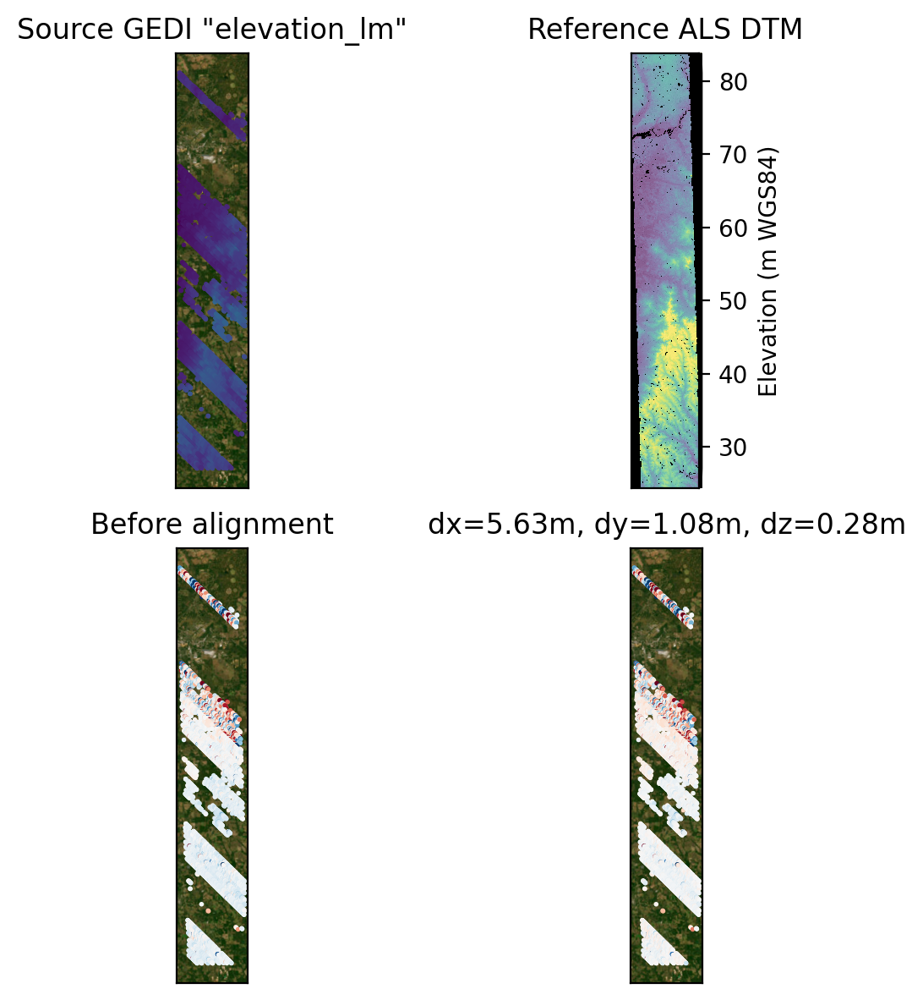

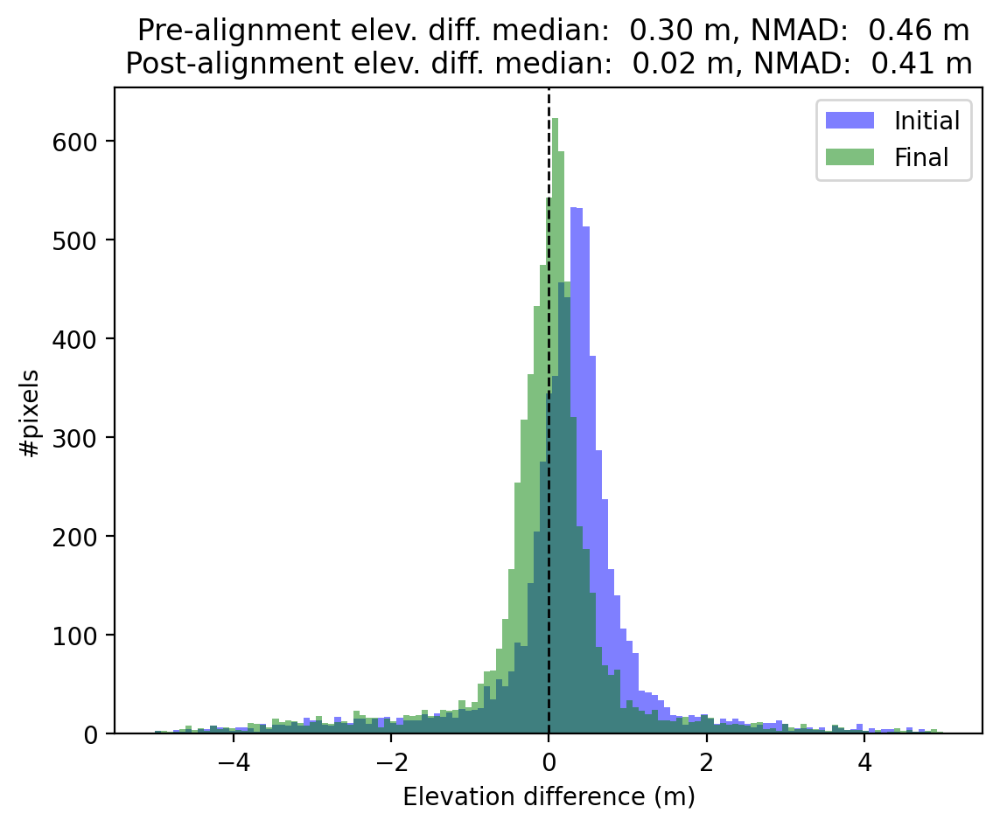

In [27]:
_ = perform_gedi_dtm_alignment(workunit_list[4])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2020307133033_O10715_03_T09706_02_003_02_V002.h5', 'GEDI02_A_2020311115609_O10776_03_T11282_02_003_02_V002.h5', 'GEDI02_A_2020314045702_O10818_02_T06489_02_003_02_V002.h5', 'GEDI02_A_2020315102144_O10837_03_T10012_02_003_02_V002.h5', 'GEDI02_A_2020318032241_O10879_02_T06642_02_003_02_V002.h5', 'GEDI02_A_2020323071439_O10959_03_T07166_02_003_02_V002.h5', 'GEDI02_A_2020326001628_O11001_02_T10911_02_003_02_V002.h5', 'GEDI02_A_2020327054135_O11020_03_T09859_02_003_02_V002.h5', 'GEDI02_A_2020329224322_O11062_02_T09335_02_003_02_V002.h5', 'GEDI02_A_2020331040823_O11081_03_T07013_02_003_02_V002.h5', 'GEDI02_A_2020333211005_O11123_02_T07912_02_003_02_V002.h5', 'GEDI02_A_2020335023508_O11142_03_T08436_02_003_02_V002.h5', 'GEDI02_A_2020337193638_O11184_02_T10758_02_003_02_V002.h5', 'GEDI02_A_2020341180306_O11245_02_T09488_02_003_02_V002.h5', 'GEDI02_A_2020345162931_O11306_02_T11064_02_003_02_V002.h5', 'GEDI02_A_20203

writing to alignment_sparse_altimetry_all_NE_Northeast_Phase2_2_2020_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750028
Alignment took 71.1958 s
Number of errors: 26855
Output: error percentile of smallest errors (meters): 16%: 0.0529324, 50%: 0.191715, 84%: 0.597889
Output: mean of smallest errors (meters): 25%: 0.0420719, 50%: 0.0882637, 75%: 0.152577, 100%: 0.623662
Final error computation took 4.61582 s
Alignment transform (origin is planet center):
                 1                  0                  0  0.655491236015223
                 0                  1                  0 -3.103726739995182
                 0                  0                  1 -3.562515700701624
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(-686511.94,-4763658.9,4172053.9)
Centroid of source points (lat,lon,z): Vector3(41.111035,-98.200686,505.20752)

Translation vector (Cartesian, meters): Vector3(0.65549124,-3.1037267,-3.5625157)
Translation vector (North-East-Down, meters): Vector3(-4.6425481,1.0915065,0.098322868

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       8.69246 meters
Min difference:       -5.88486 meters
Mean difference:      0.337703 meters
StdDev of difference: 0.857864 meters
Median difference:    0.144278 meters
Writing difference file: initial_proj-diff.csv


Child returned 0




Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_NE_Northeast_Phase2_2_2020_proj/gedi_aligned2DTM-trans_source.csv and NE_Northeast_Phase2_2_2020-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_NE_Northeast_Phase2_2_2020_proj/gedi_aligned2DTM-trans_source.csv NE_Northeast_Phase2_2_2020-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/NE_Northeast_Phase2_2_2020_processing/UTM_14N_WGS84_G2139_3D.wkt' -o final_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       8.56692 meters
Min difference:       -5.86464 meters
Mean difference:      0.231765 meters
StdDev of differenc

Child returned 0




Final elevation difference saved at final_proj-diff.csv


/home/sbhusha1/.conda/envs/coincident/lib/python3.13/site-packages/contextily/tile.py:592: RuntimeWarning: invalid value encountered in subtract
  lon_length = np.subtract(*lon_range)
/home/sbhusha1/.conda/envs/coincident/lib/python3.13/site-packages/contextily/tile.py:597: RuntimeWarning: divide by zero encountered in scalar divide
  zoom_lat = np.ceil(np.log2(360 * 2.0 / lat_length))


ValueError: cannot convert float NaN to integer

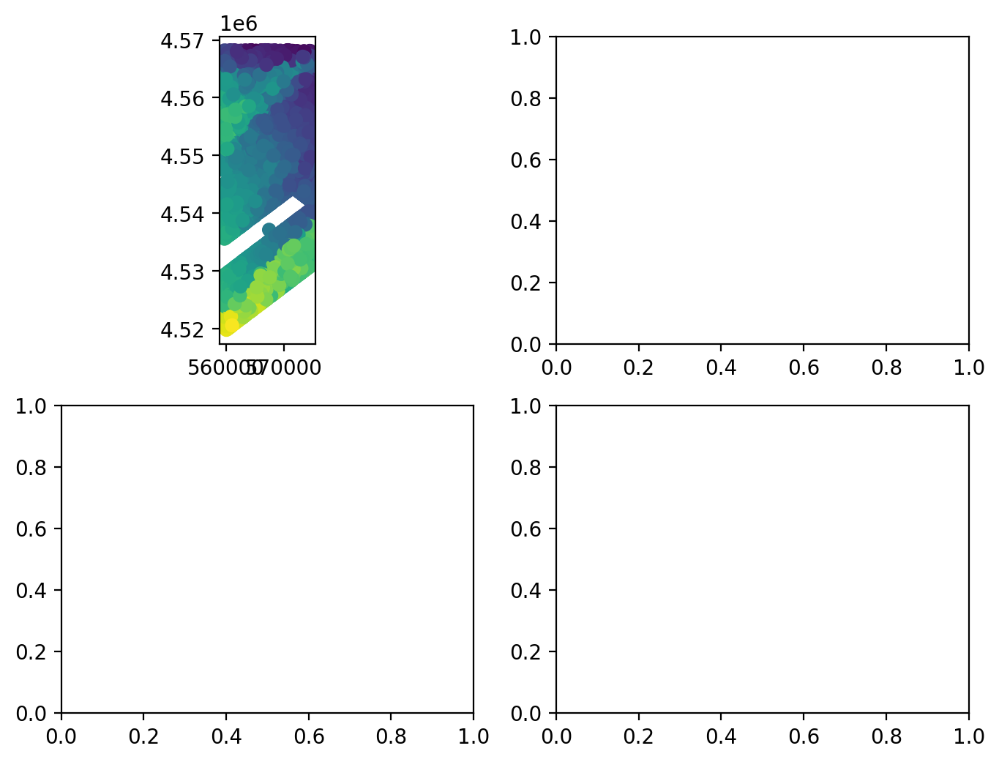

In [36]:
_ = perform_gedi_dtm_alignment(workunit_list[5])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2019249064153_O04152_02_T01470_02_003_01_V002.h5', 'GEDI02_A_2019257110927_O04279_03_T04122_02_003_01_V002.h5', 'GEDI02_A_2019271214434_O04503_02_T04163_02_003_01_V002.h5', 'GEDI02_A_2019284003705_O04691_03_T04428_02_003_01_V002.h5', 'GEDI02_A_2019298111055_O04915_02_T04622_02_003_01_V002.h5', 'GEDI02_A_2019306154007_O05042_03_T01429_02_003_01_V002.h5']
['2019-09-06T00:00:00.000', '2019-11-02T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/TX_DesertMountains_B1_2018_processing
<xarray.DataArray ()> Size: 4B
array(1267.0374, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(1470.0522, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(1589.7322, dtype=float32)
Coordinates:
    b

writing to alignment_sparse_altimetry_all_TX_DesertMountains_B1_2018_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750129
Alignment took 46.5309 s
Number of errors: 5811
Output: error percentile of smallest errors (meters): 16%: 0.0837236, 50%: 0.346755, 84%: 0.753521
Output: mean of smallest errors (meters): 25%: 0.0658845, 50%: 0.150952, 75%: 0.264901, 100%: 0.453127
Final error computation took 0.541957 s
Alignment transform (origin is planet center):
                1                 0                 0 13.50434982939623
                0                 1                 0 3.317081524059176
                0                 0                 1 10.44869642099366
                0                 0                 0                 1
Centroid of source points (Cartesian, meters): Vector3(-1470620.7,-5234586.7,3325851.8)
Centroid of source points (lat,lon,z): Vector3(31.624809,-105.69234,1474.5861)

Translation vector (Cartesian, meters): Vector3(13.50435,3.3170815,10.448696)
Translation vector (North-East-Down, meters): Vector3(12.486792,12.103838,0.35053896)
Translation vector ma

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       12.2749 meters
Min difference:       -16.4123 meters
Mean difference:      0.31026 meters
StdDev of difference: 0.781158 meters
Median difference:    0.262403 meters
Writing difference file: initial_proj-diff.csv


Child returned 0




Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_TX_DesertMountains_B1_2018_proj/gedi_aligned2DTM-trans_source.csv and TX_DesertMountains_B1_2018-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_TX_DesertMountains_B1_2018_proj/gedi_aligned2DTM-trans_source.csv TX_DesertMountains_B1_2018-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/TX_DesertMountains_B1_2018_processing/UTM_13N_WGS84_G2139_3D.wkt' -o final_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       11.1224 meters
Min difference:       -13.8589 meters
Mean difference:      -0.00342638 meters
StdDev of differ

Child returned 0


Aligned GEDI product saved at GEDI_aligned_product_TX_DesertMountains_B1_2018.gpkg
******************
Translation vector: dx = 12.49m, dy = 12.10m, dz = 0.35m
******************


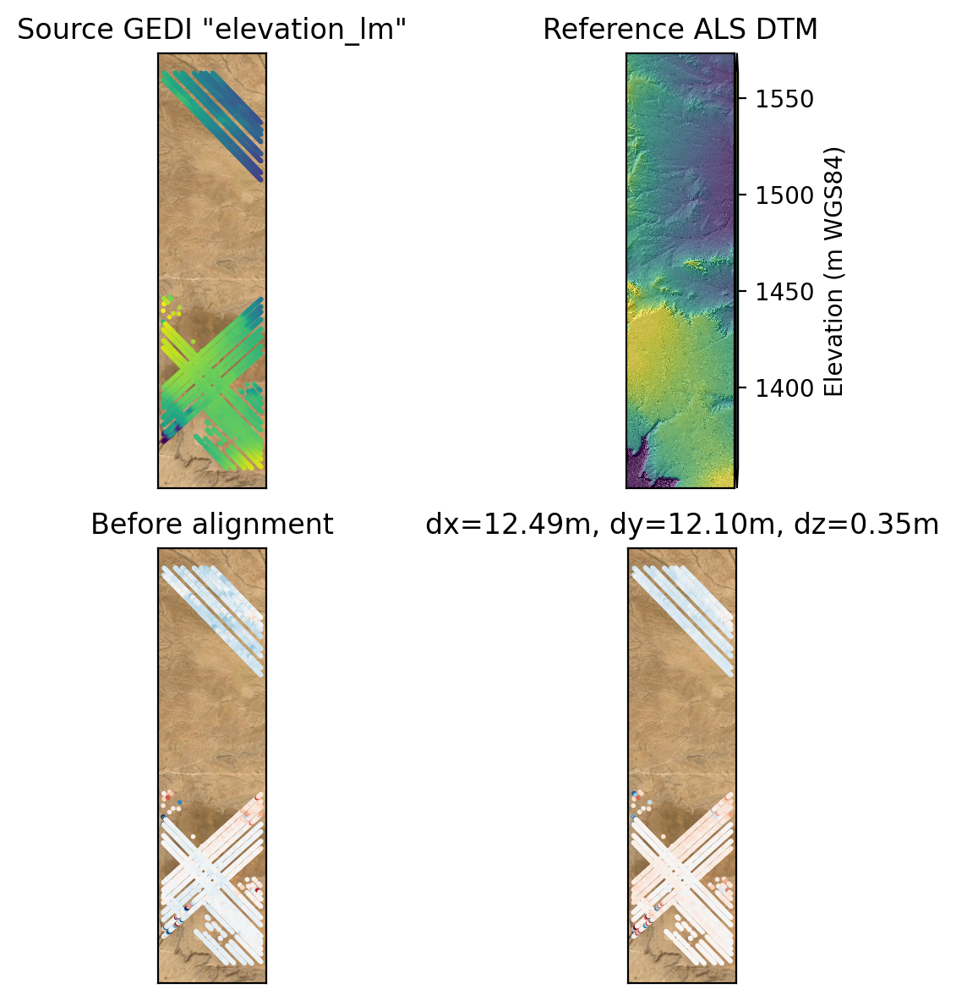

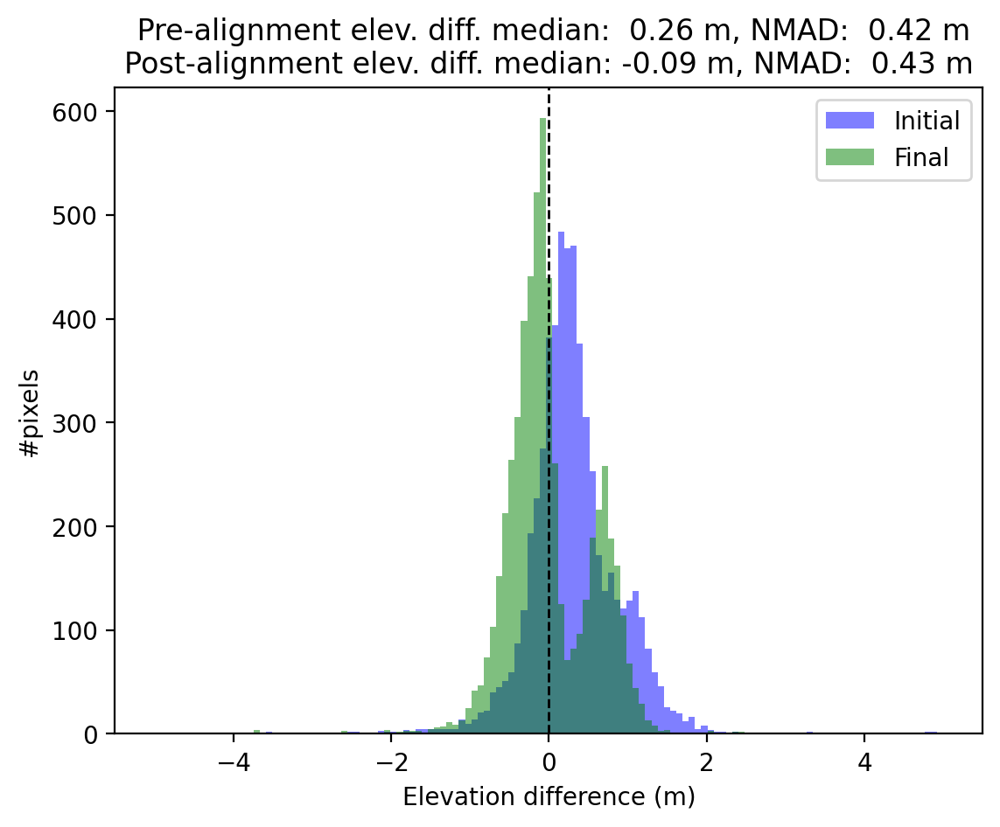

In [28]:
_ = perform_gedi_dtm_alignment(workunit_list[6])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2020098225152_O07481_03_T04610_02_003_01_V002.h5', 'GEDI02_A_2020126115921_O07908_03_T04457_02_003_01_V002.h5', 'GEDI02_A_2020130102505_O07969_03_T01764_02_003_01_V002.h5']
['2020-04-07T00:00:00.000', '2020-05-09T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/WI_Brown_2_2020_processing
<xarray.DataArray ()> Size: 4B
array(138.216, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(147.87302, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0 <xarray.DataArray ()> Size: 4B
array(180.0813, dtype=float32)
Coordinates:
    band         int64 8B 1
    spatial_ref  int64 8B 0
../../../pcd_usgs_lpc_proc_total_bounds/WI_Brown_2_2020_processing/UTM_16N_WGS84_G2139_3D.wkt
../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26

writing to alignment_sparse_altimetry_all_WI_Brown_2_2020_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750663
Alignment took 28.3203 s
Number of errors: 754
Output: error percentile of smallest errors (meters): 16%: 0.0346813, 50%: 0.123764, 84%: 0.322836
Output: mean of smallest errors (meters): 25%: 0.026712, 50%: 0.057128, 75%: 0.0942556, 100%: 0.926872
Final error computation took 0.345726 s
Alignment transform (origin is planet center):
                 1                  0                  0  -1.75432408702909
                 0                  1                  0  1.698310405947268
                 0                  0                  1 0.8387468280270696
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(154142.58,-4546916.1,4455391.9)
Centroid of source points (lat,lon,z): Vector3(44.59345,-88.05839,146.63537)

Translation vector (Cartesian, meters): Vector3(-1.7543241,1.6983104,0.83874683)
Translation vector (North-East-Down, meters): Vector3(1.8306579,-1.6957764,0.66214922)
Trans

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 94%
Max difference:       2.4106 meters
Min difference:       -5.0106 meters
Mean difference:      0.653435 meters
StdDev of difference: 0.373156 meters
Median difference:    0.674668 meters
Writing difference file: initial_proj-diff.csv


Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_WI_Brown_2_2020_proj/gedi_aligned2DTM-trans_source.csv and WI_Brown_2_2020-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_WI_Brown_2_2020_proj/gedi_aligned2DTM-trans_source.csv WI_Brown_2_2020-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/WI_Brown_2_2020_process

Child returned 0


	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 94%
Max difference:       2.33905 meters
Min difference:       -5.73277 meters
Mean difference:      -0.0170916 meters
StdDev of difference: 0.388622 meters
Median difference:    0.00139452 meters
Writing difference file: final_proj-diff.csv


Final elevation difference saved at final_proj-diff.csv


Child returned 0


Aligned GEDI product saved at GEDI_aligned_product_WI_Brown_2_2020.gpkg
******************
Translation vector: dx = 1.83m, dy = -1.70m, dz = 0.66m
******************


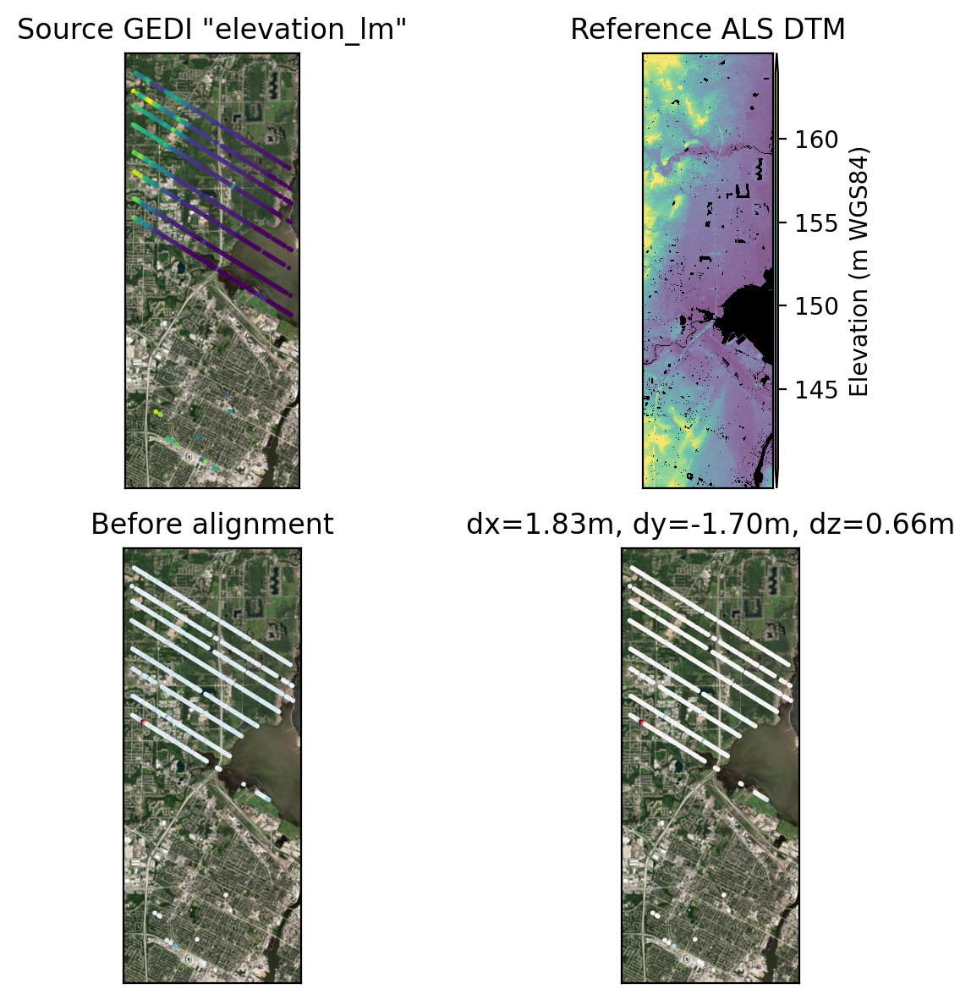

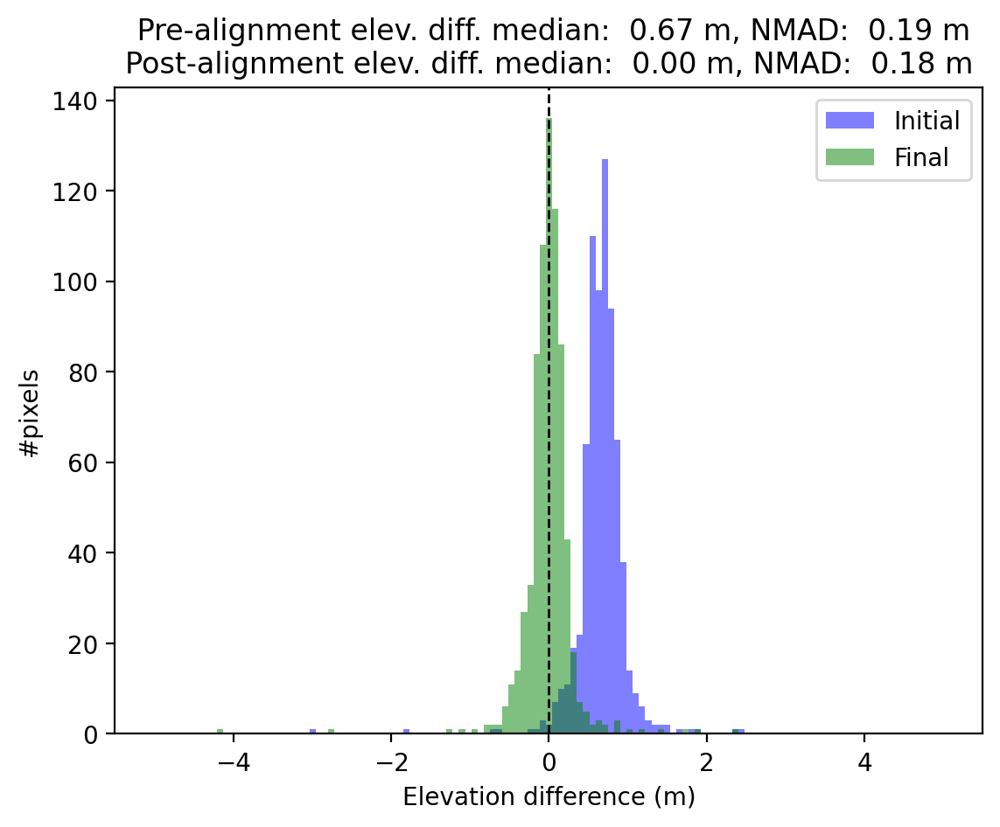

In [29]:
_ = perform_gedi_dtm_alignment(workunit_list[7])

Current working directory: /panfs/ccds02/home/sbhusha1/notebooks/pcd
['GEDI02_A_2019194055411_O03298_02_T00155_02_003_01_V002.h5', 'GEDI02_A_2019200084834_O03393_03_T03035_02_003_02_V002.h5', 'GEDI02_A_2019209000122_O03527_02_T04730_02_003_01_V002.h5', 'GEDI02_A_2019211043557_O03561_03_T00847_02_003_01_V002.h5', 'GEDI02_A_2019219194832_O03695_02_T03965_02_003_02_V002.h5', 'GEDI02_A_2019223180803_O03756_02_T03613_02_003_01_V002.h5', 'GEDI02_A_2019225224231_O03790_03_T02729_02_003_01_V002.h5', 'GEDI02_A_2019242104318_O04046_02_T02343_02_003_02_V002.h5', 'GEDI02_A_2019244151907_O04080_03_T02576_02_003_02_V002.h5', 'GEDI02_A_2019257045811_O04275_02_T00002_02_003_01_V002.h5', 'GEDI02_A_2019261032101_O04336_02_T04883_02_003_01_V002.h5', 'GEDI02_A_2019267062026_O04431_03_T05575_02_003_01_V002.h5']
['2019-07-13T00:00:00.000', '2019-09-24T00:00:00.000']
Current working directory is /panfs/ccds02/nobackup/people/sbhusha1/pcd/pcd_first_product_delivery_sep17_25/usgs_pcd_products/WY_FEMA_East_B9_2

writing to alignment_sparse_altimetry_all_WY_FEMA_East_B9_2019_proj/gedi_aligned2DTM-iterationInfo.csv


Match ratio: 0.750027
Alignment took 30.7303 s
Number of errors: 9265
Output: error percentile of smallest errors (meters): 16%: 0.448682, 50%: 2.39942, 84%: 8.81821
Output: mean of smallest errors (meters): 25%: 0.360714, 50%: 0.935265, 75%: 1.92731, 100%: 4.74238
Final error computation took 2.59282 s
Alignment transform (origin is planet center):
                 1                  0                  0 0.2465671189129353
                 0                  1                  0 -1.884260457009077
                 0                  0                  1 -2.433585372753441
                 0                  0                  0                  1
Centroid of source points (Cartesian, meters): Vector3(-1558051.7,-4384590.8,4352281.7)
Centroid of source points (lat,lon,z): Vector3(43.278184,-109.56252,3251.0957)

Translation vector (Cartesian, meters): Vector3(0.24656712,-1.8842605,-2.4335854)
Translation vector (North-East-Down, meters): Vector3(-2.9323094,0.86325134,0.43580884)
Transl

Child returned 0


Computing elevation difference before alignment between GEDI_filtered_all_control_points_utm_WY_FEMA_East_B9_2019.csv and WY_FEMA_East_B9_2019-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff GEDI_filtered_all_control_points_utm_WY_FEMA_East_B9_2019.csv WY_FEMA_East_B9_2019-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/WY_FEMA_East_B9_2019_processing/UTM_12N_WGS84_G2139_3D.wkt' -o initial_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       103.376 meters
Min difference:       -150.897 meters
Mean difference:      -0.08252 meters
StdDev of difference: 11.4814 meters
Median difference:    0.374248 meters
Writing difference file: initial_proj-diff.csv


Child returned 0




Initial elevation difference saved at initial_proj-diff.csv
Computing elevation difference before alignment between alignment_sparse_altimetry_all_WY_FEMA_East_B9_2019_proj/gedi_aligned2DTM-trans_source.csv and WY_FEMA_East_B9_2019-DTM_fill_window_size_4_mos.tif


../../../../sw/StereoPipeline-3.6.0-alpha-2025-09-26-x86_64-Linux/bin/geodiff alignment_sparse_altimetry_all_WY_FEMA_East_B9_2019_proj/gedi_aligned2DTM-trans_source.csv WY_FEMA_East_B9_2019-DTM_fill_window_size_4_mos.tif --csv-format 1:easting,2:northing,3:height_above_datum --csv-srs '../../../pcd_usgs_lpc_proc_total_bounds/WY_FEMA_East_B9_2019_processing/UTM_12N_WGS84_G2139_3D.wkt' -o final_proj
	--> Setting number of processing threads to: 4
	Found input nodata value for DEM: -9999
        --> [*************************************************************] 100%
Max difference:       101.054 meters
Min difference:       -148.722 meters
Mean difference:      -0.543585 meters
StdDev of difference: 11.1176 meters
Median diff

Child returned 0




Final elevation difference saved at final_proj-diff.csv
Aligned GEDI product saved at GEDI_aligned_product_WY_FEMA_East_B9_2019.gpkg
******************
Translation vector: dx = -2.93m, dy = 0.86m, dz = 0.44m
******************


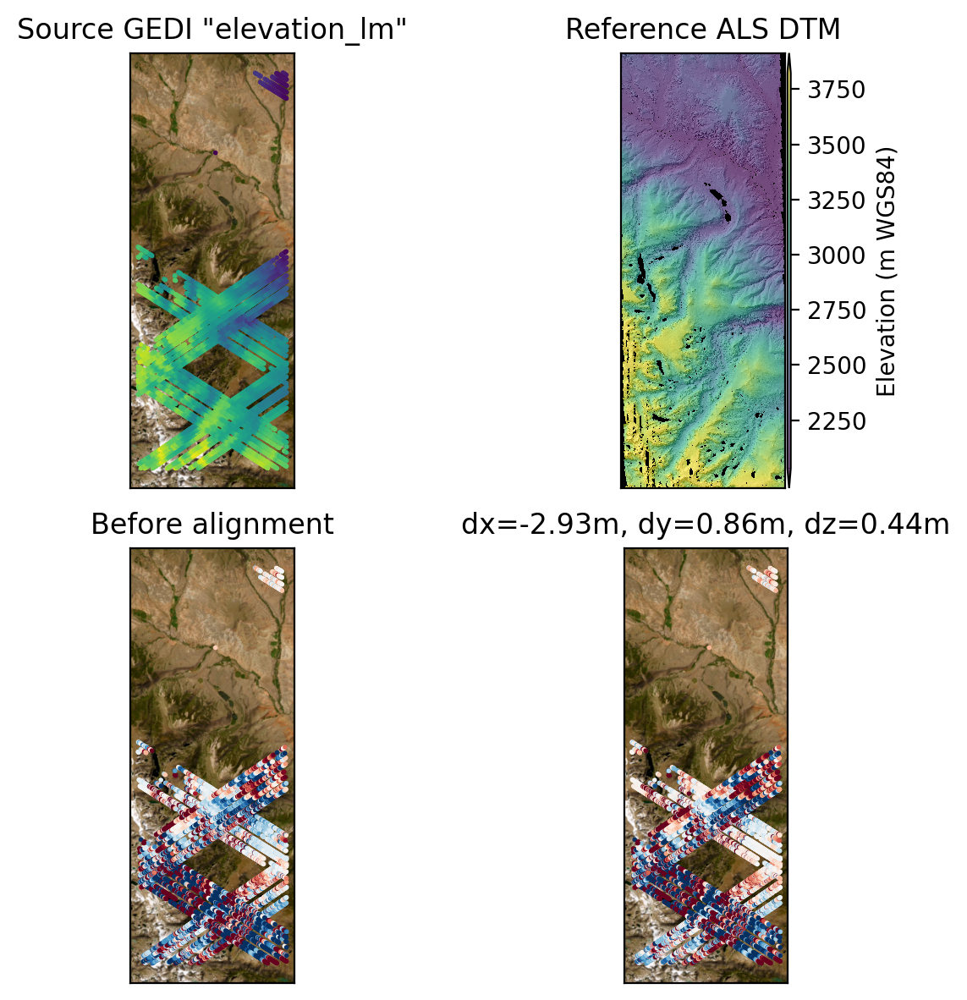

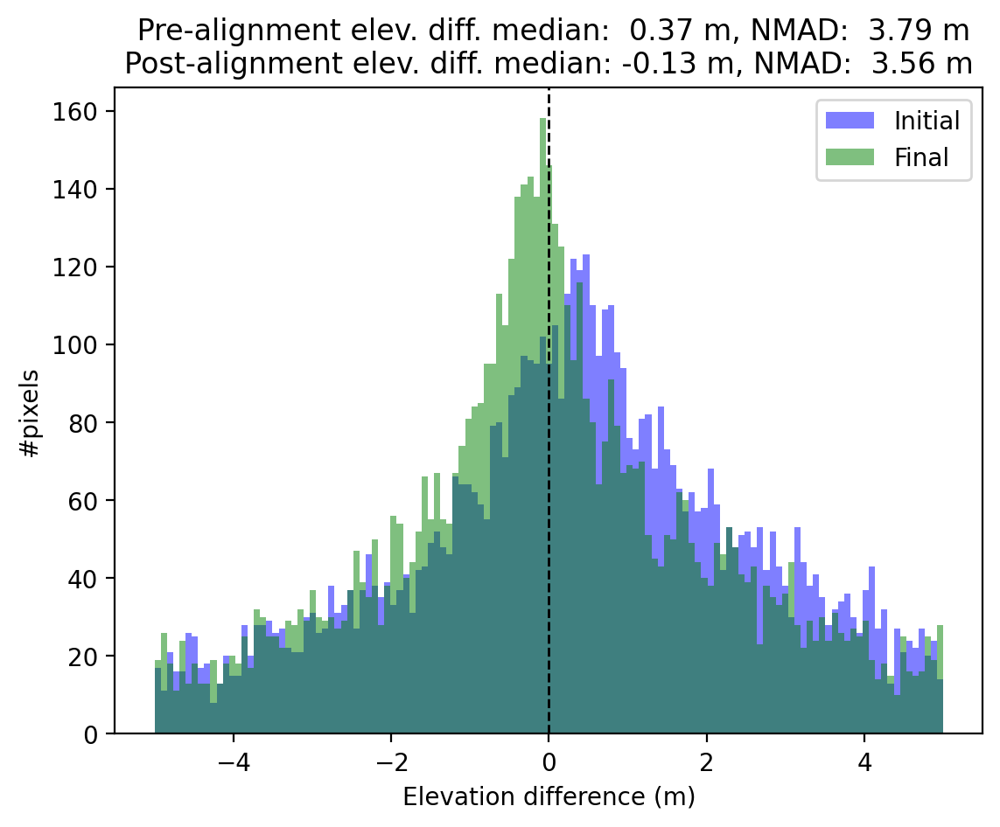

In [30]:
_ = perform_gedi_dtm_alignment(workunit_list[8])